In [2]:
import pandas as pd
import numpy as np

#### Dataset Link : https://archive.ics.uci.edu/dataset/275/bike+sharing+dataset

In [3]:
data = pd.read_csv('hour.csv')
data.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


In [4]:
# looking at the unique values in each of the features
data.nunique()

instant       17379
dteday          731
season            4
yr                2
mnth             12
hr               24
holiday           2
weekday           7
workingday        2
weathersit        4
temp             50
atemp            65
hum              89
windspeed        30
casual          322
registered      776
cnt             869
dtype: int64

In [5]:
# checking the value counts of each category for the categorical variables
for feature in data.columns:
    if data[feature].nunique() < 10:
        print(data[feature].value_counts())
        print('-' * 60)

season
3    4496
2    4409
1    4242
4    4232
Name: count, dtype: int64
------------------------------------------------------------
yr
1    8734
0    8645
Name: count, dtype: int64
------------------------------------------------------------
holiday
0    16879
1      500
Name: count, dtype: int64
------------------------------------------------------------
weekday
6    2512
0    2502
5    2487
1    2479
3    2475
4    2471
2    2453
Name: count, dtype: int64
------------------------------------------------------------
workingday
1    11865
0     5514
Name: count, dtype: int64
------------------------------------------------------------
weathersit
1    11413
2     4544
3     1419
4        3
Name: count, dtype: int64
------------------------------------------------------------


In [6]:
# checking the data types of the various features
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     17379 non-null  int64  
 1   dteday      17379 non-null  object 
 2   season      17379 non-null  int64  
 3   yr          17379 non-null  int64  
 4   mnth        17379 non-null  int64  
 5   hr          17379 non-null  int64  
 6   holiday     17379 non-null  int64  
 7   weekday     17379 non-null  int64  
 8   workingday  17379 non-null  int64  
 9   weathersit  17379 non-null  int64  
 10  temp        17379 non-null  float64
 11  atemp       17379 non-null  float64
 12  hum         17379 non-null  float64
 13  windspeed   17379 non-null  float64
 14  casual      17379 non-null  int64  
 15  registered  17379 non-null  int64  
 16  cnt         17379 non-null  int64  
dtypes: float64(4), int64(12), object(1)
memory usage: 2.3+ MB


In [7]:
# descriptive analysis of the data
data.describe().T

,count,mean,std,min,25%,50%,75%,max
instant,17379.0,8690.000000,5017.029500,1.00,4345.5000,8690.0000,13034.5000,17379.0000
season,17379.0,2.501640,1.106918,1.00,2.0000,3.0000,3.0000,4.0000
yr,17379.0,0.502561,0.500008,0.00,0.0000,1.0000,1.0000,1.0000
mnth,17379.0,6.537775,3.438776,1.00,4.0000,7.0000,10.0000,12.0000
hr,17379.0,11.546752,6.914405,0.00,6.0000,12.0000,18.0000,23.0000
holiday,17379.0,0.028770,0.167165,0.00,0.0000,0.0000,0.0000,1.0000
weekday,17379.0,3.003683,2.005771,0.00,1.0000,3.0000,5.0000,6.0000
workingday,17379.0,0.682721,0.465431,0.00,0.0000,1.0000,1.0000,1.0000
weathersit,17379.0,1.425283,0.639357,1.00,1.0000,1.0000,2.0000,4.0000
temp,17379.0,0.496987,0.192556,0.02,0.3400,0.5000,0.6600,1.0000


# Exploratory Data Analysis

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

In [9]:
num_features = [feature for feature in data.columns if feature != 'dteday']

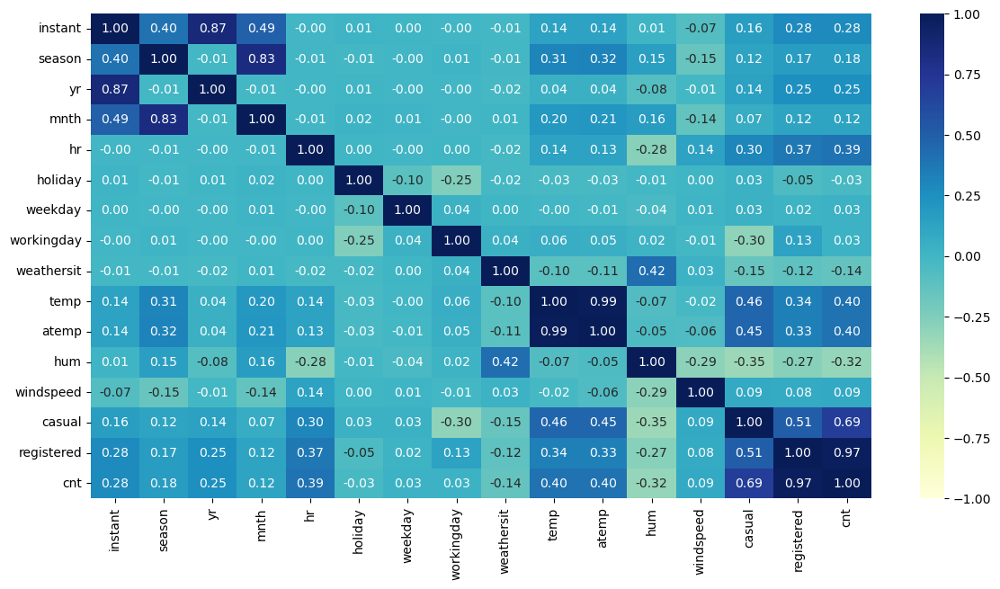

In [10]:
plt.figure(figsize=(14,7))
sns.heatmap(data[num_features].corr(), annot=True, vmin=-1, vmax=1, cmap='YlGnBu', fmt='.2f')
plt.show();

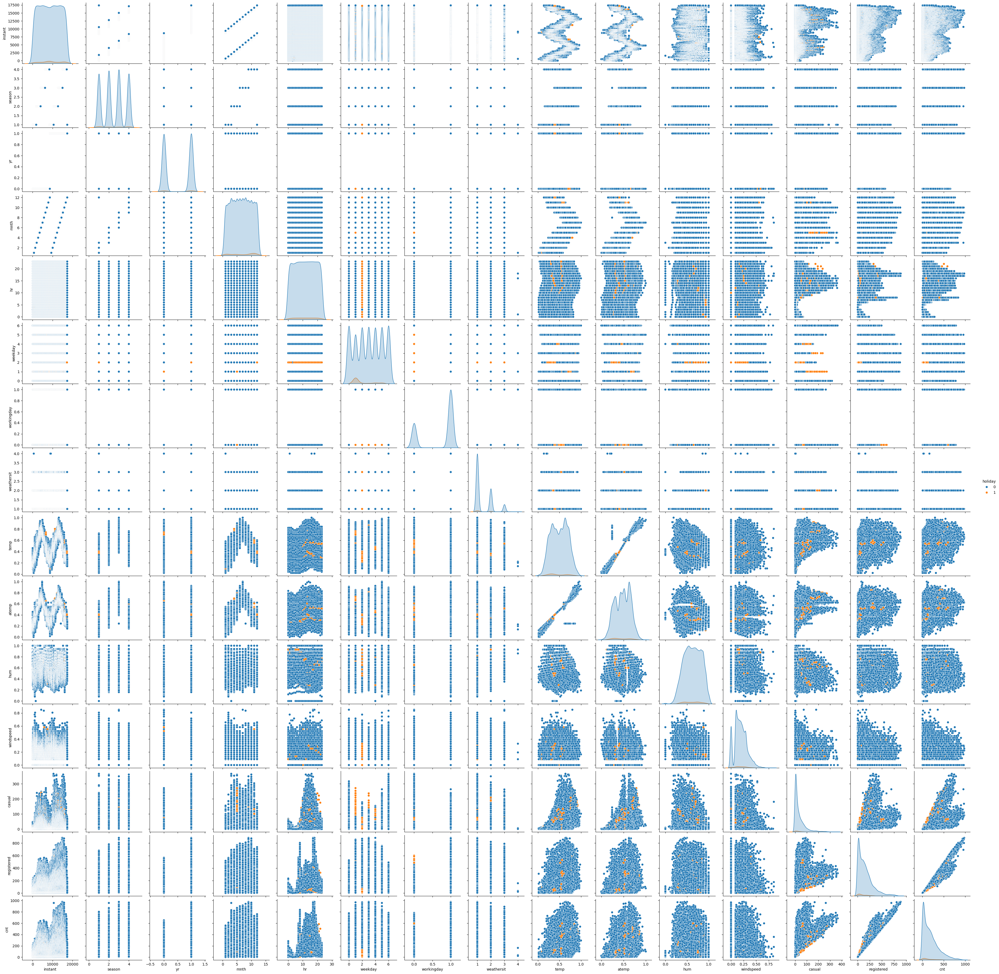

In [11]:
sns.pairplot(data=data, hue='holiday')
plt.show();

In [12]:
data['dteday'] = pd.to_datetime(data['dteday'])

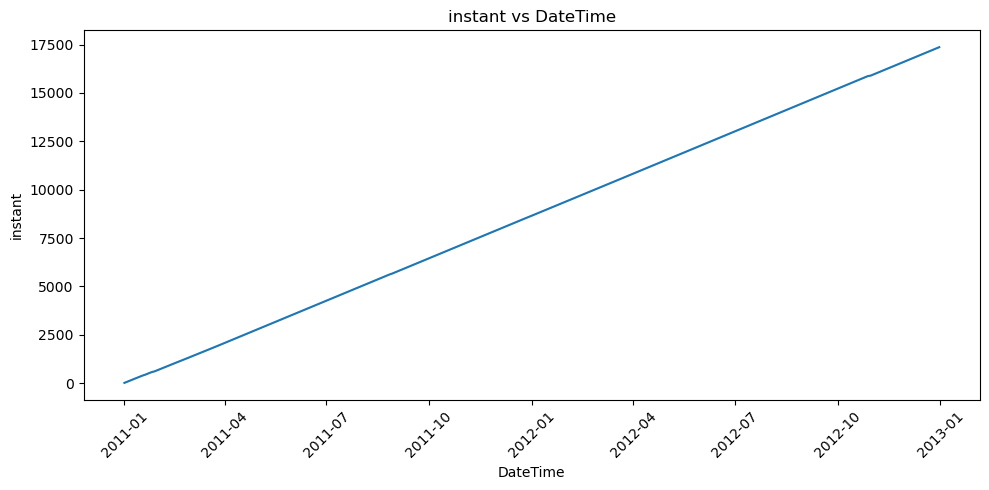

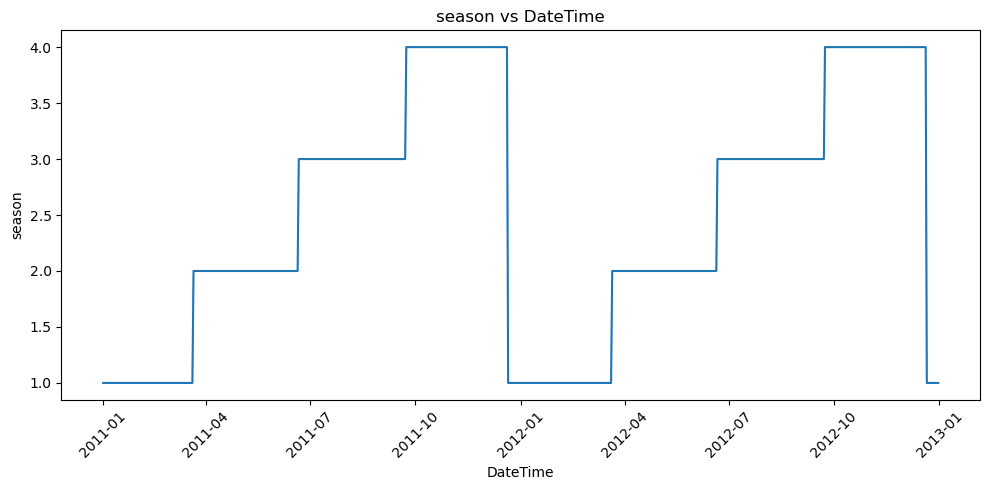

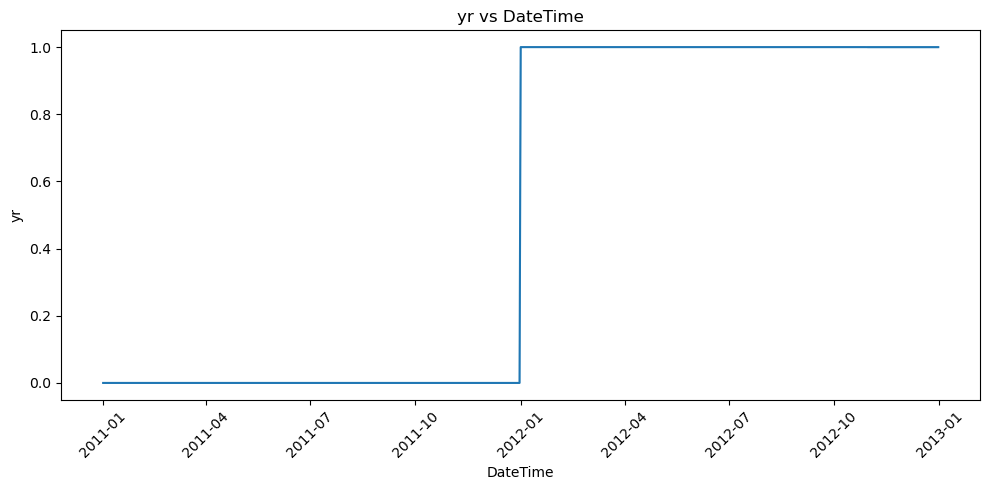

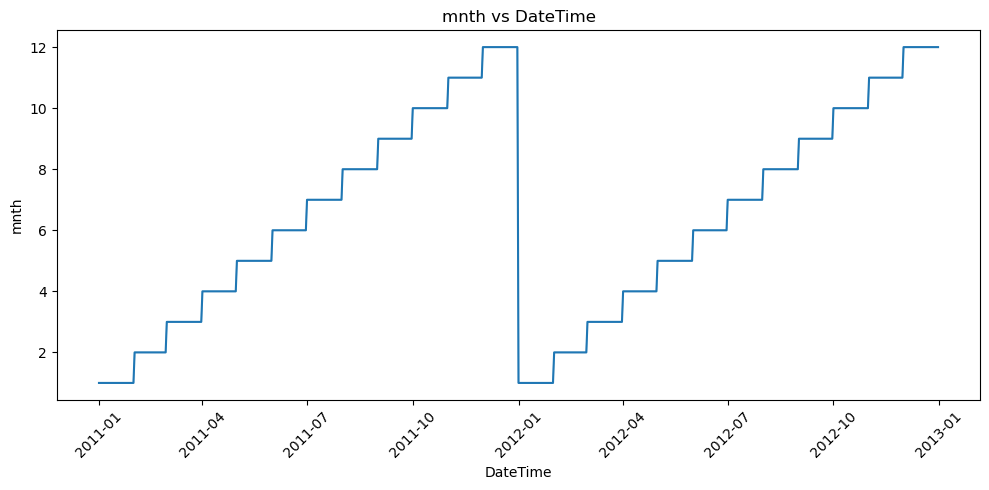

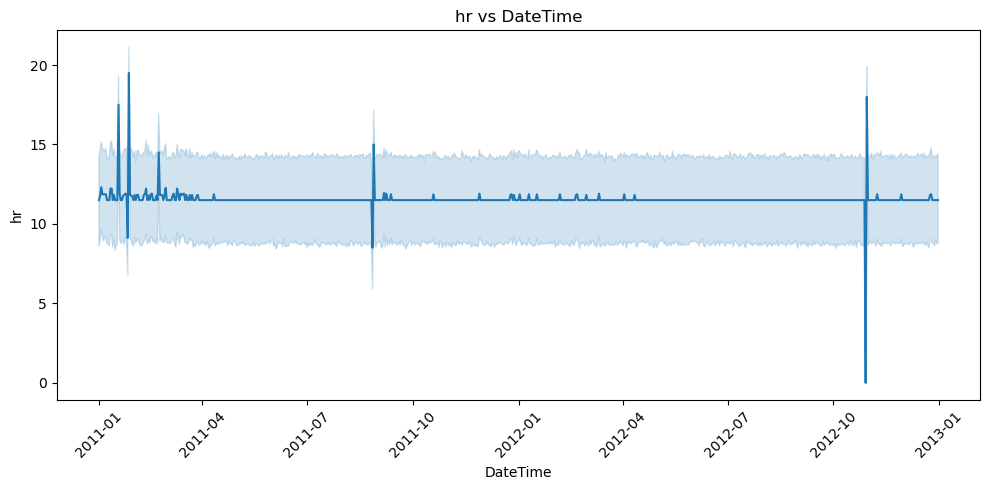

...

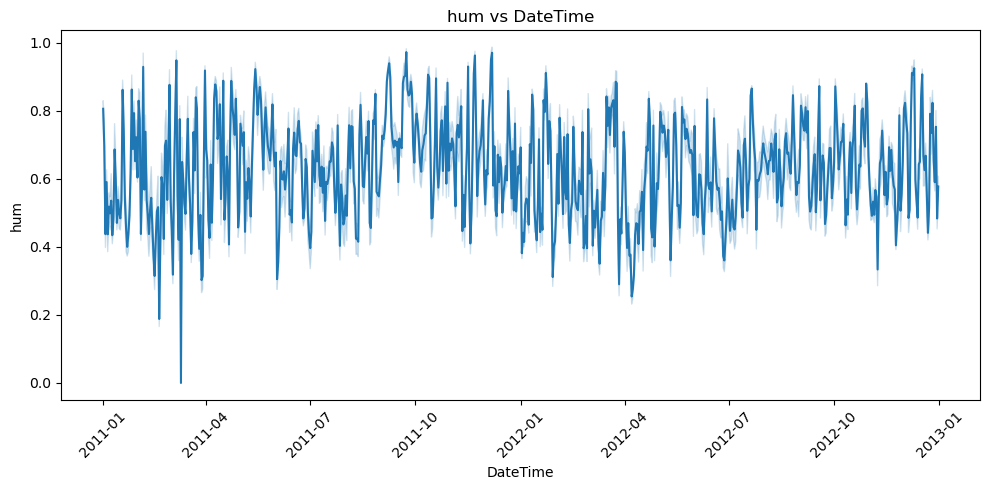

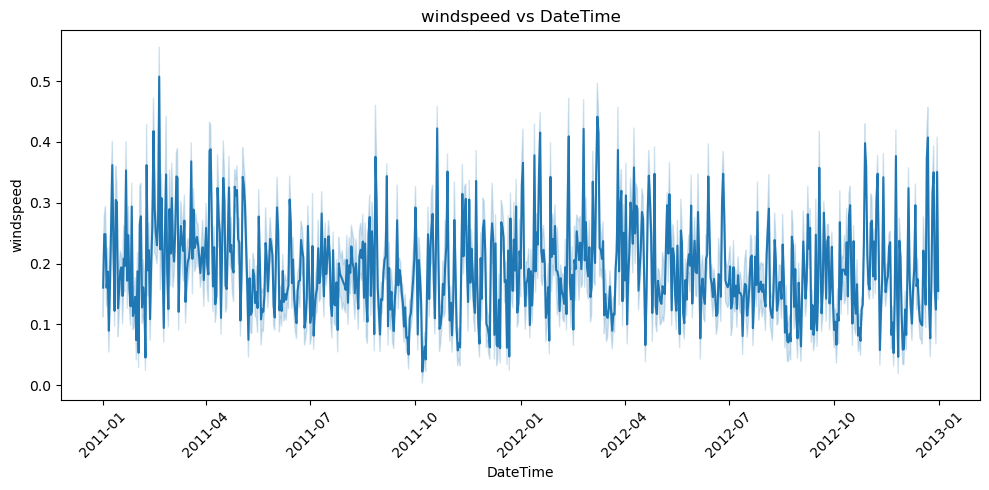

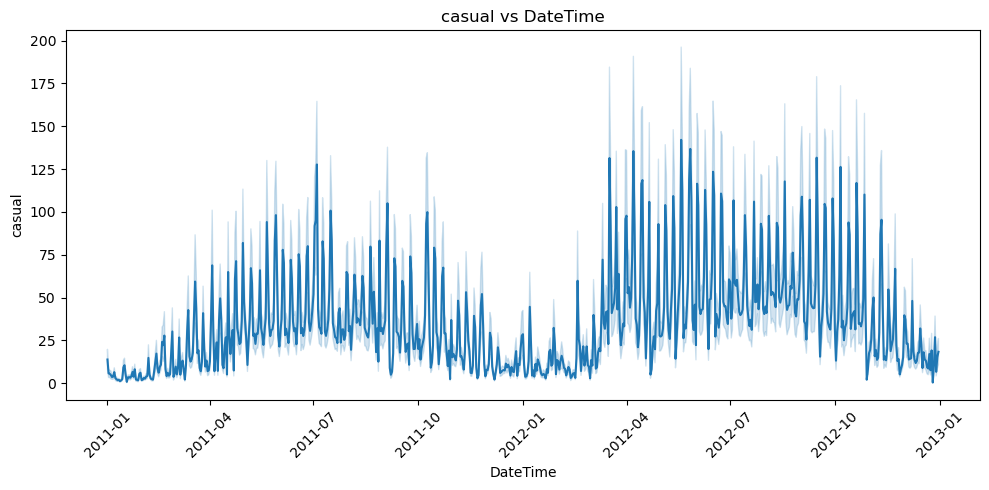

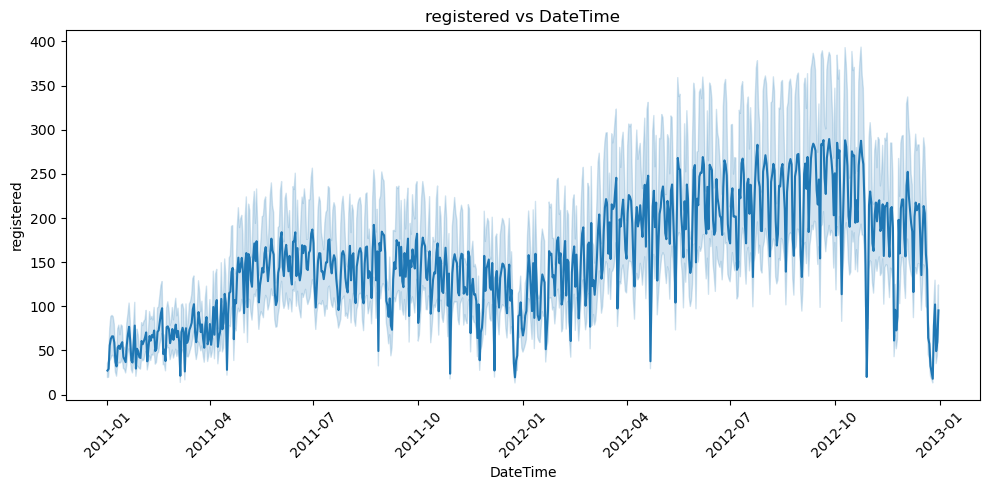

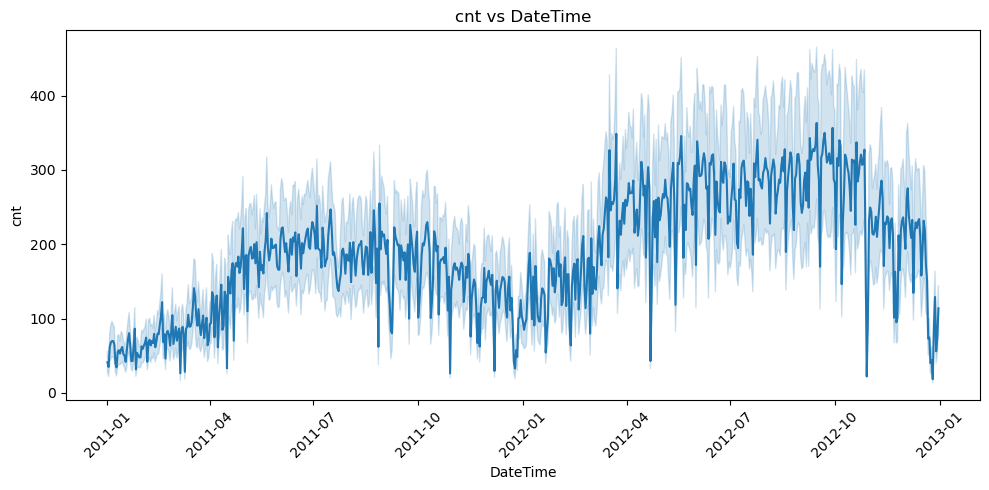

In [13]:
# lineplot for all numerical features vs dates

# Loop through each numerical feature
for feature in num_features:
    plt.figure(figsize=(10, 5))
    sns.lineplot(data=data, x='dteday', y=feature)
    plt.title(f'{feature} vs DateTime')
    plt.xlabel('DateTime')
    plt.ylabel(feature)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

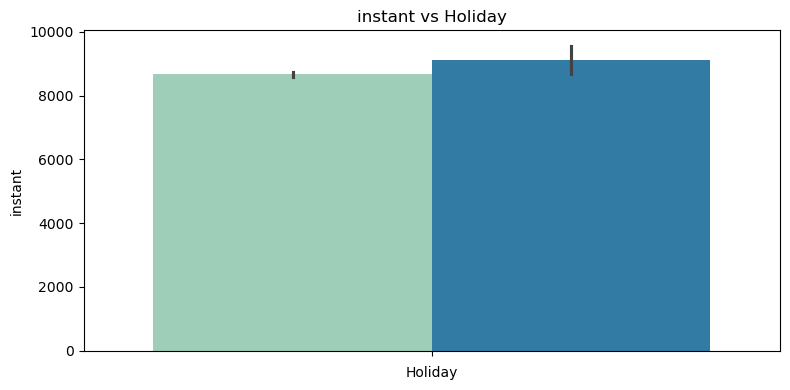

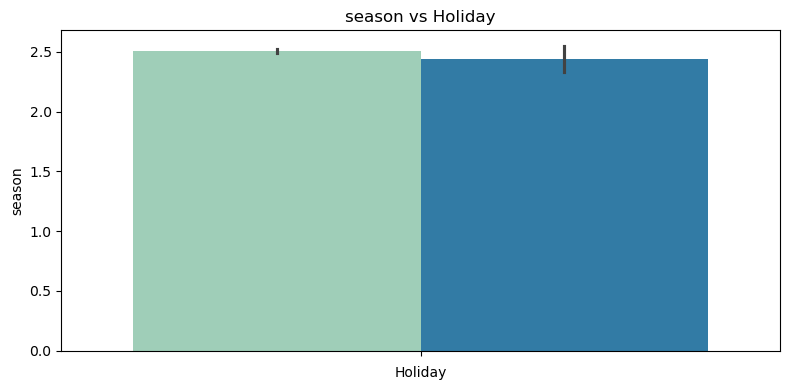

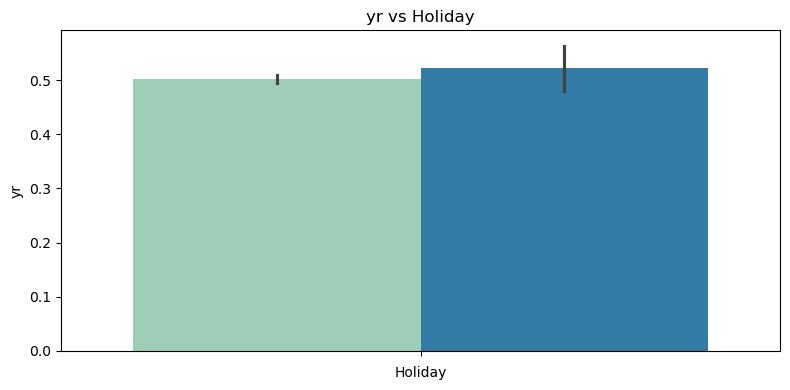

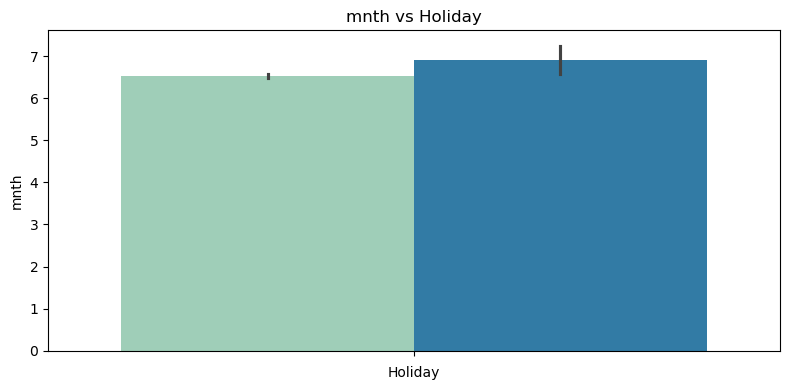

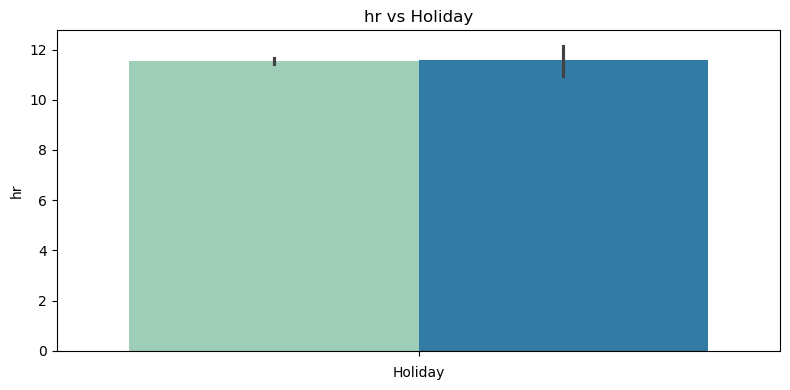

...

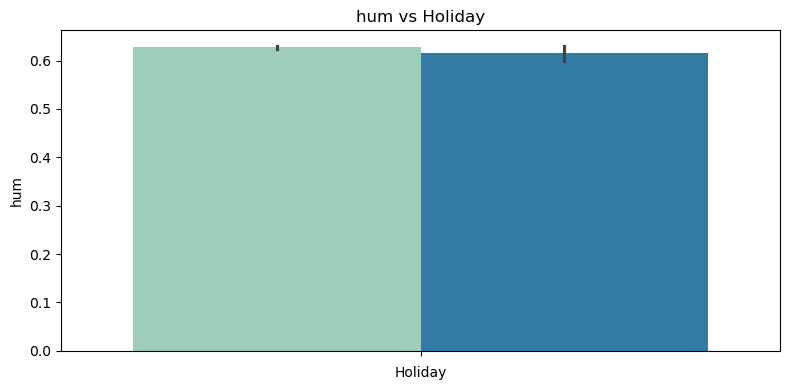

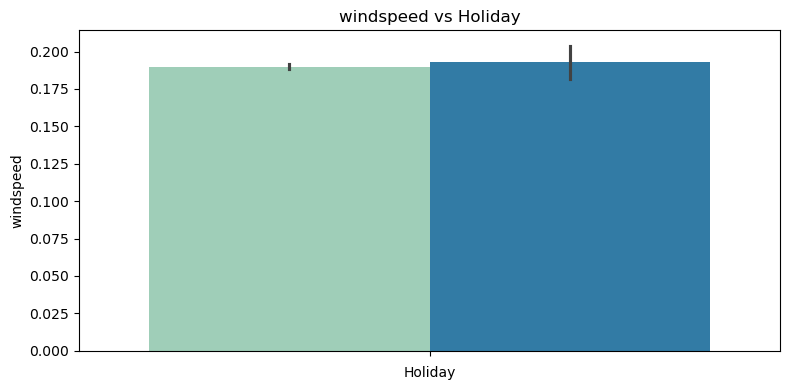

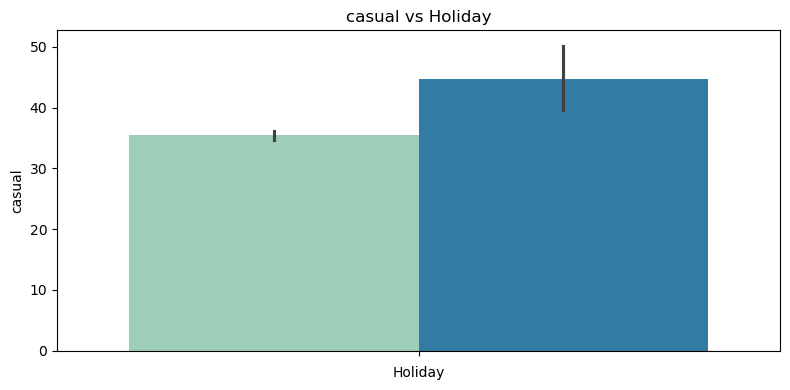

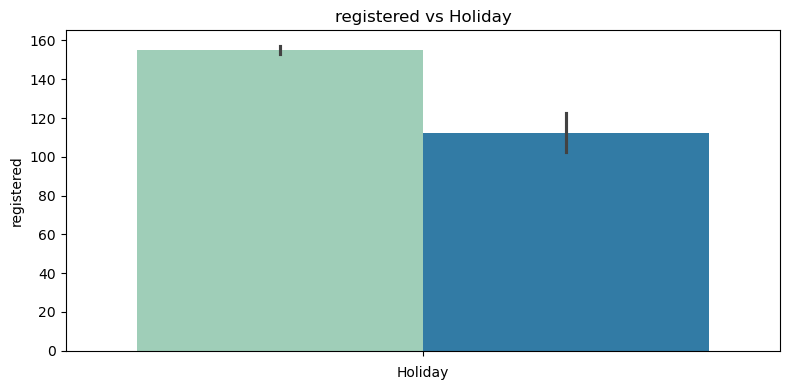

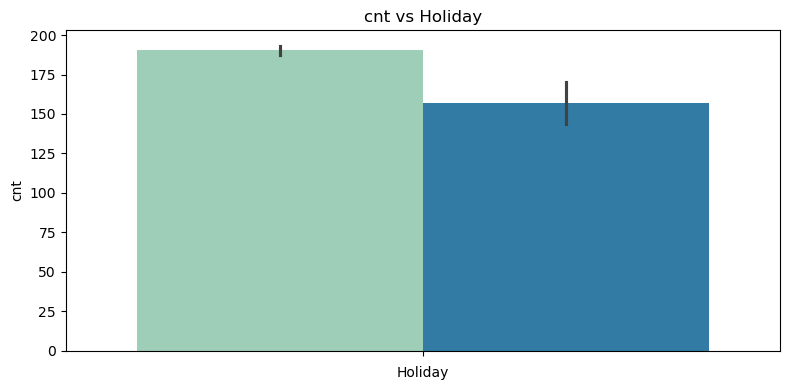

In [14]:
# plotting the features vs holiday
for feature in data[num_features]:
    plt.figure(figsize=(8,4))
    sns.barplot(data=data, hue='holiday',y=feature, palette='YlGnBu', legend=False)
    plt.title(f'{feature} vs Holiday')
    plt.xlabel('Holiday')
    plt.ylabel(feature)
    plt.tight_layout()
    plt.show();

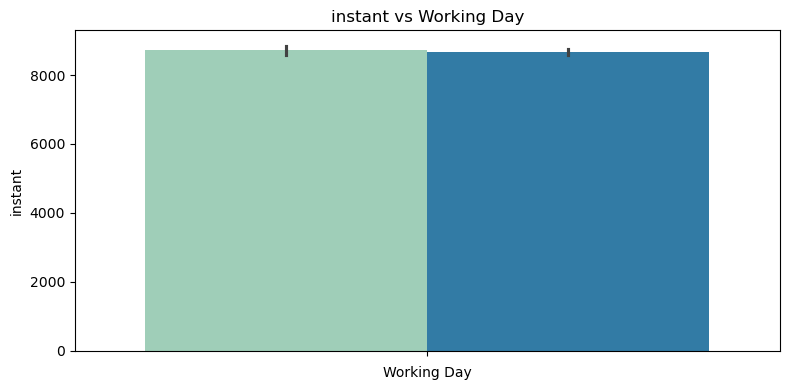

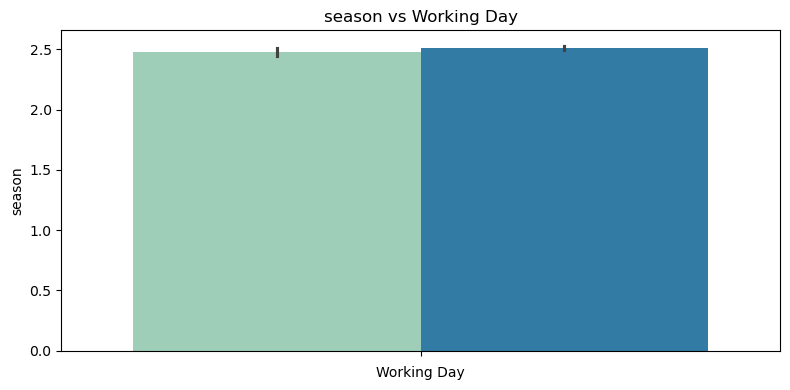

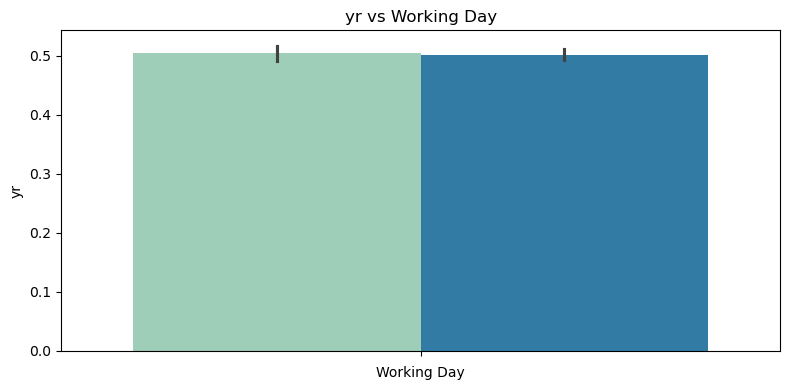

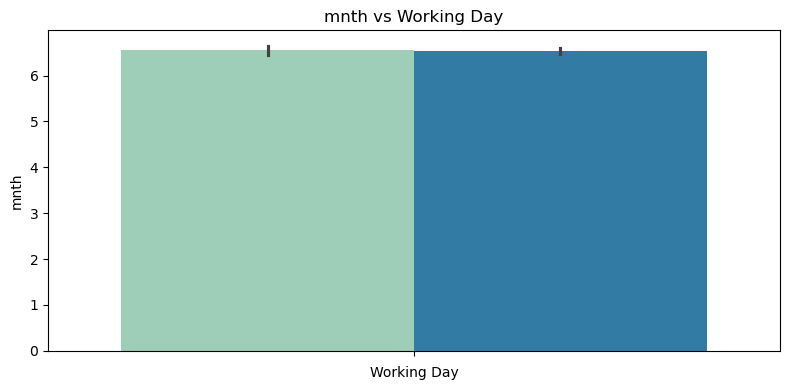

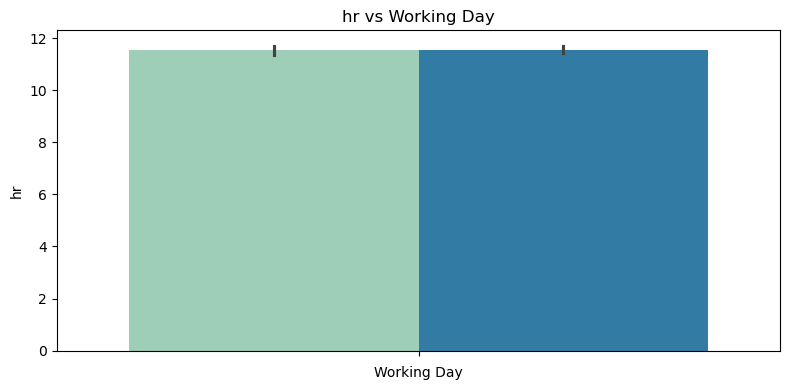

...

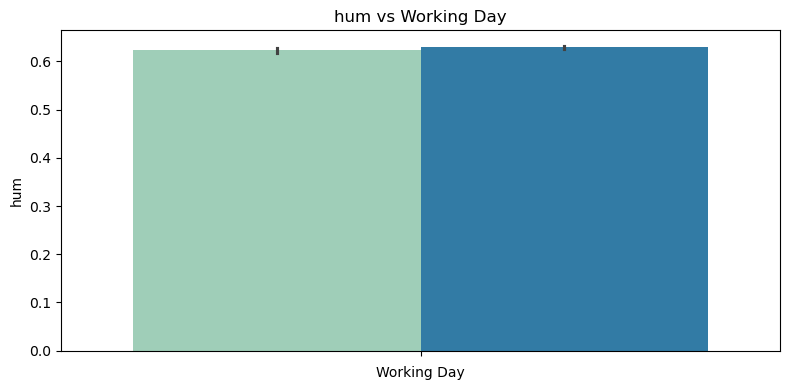

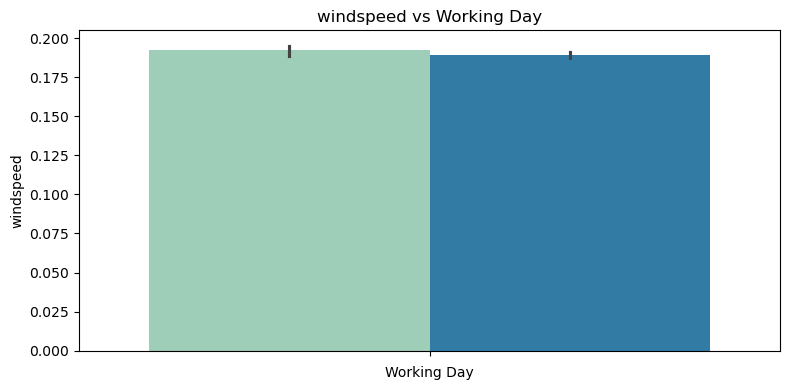

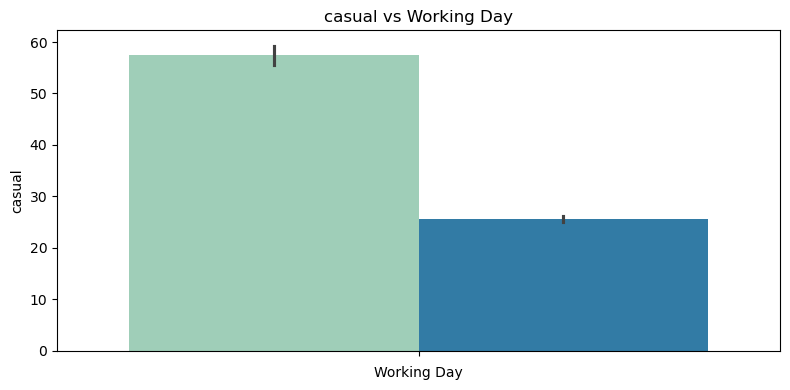

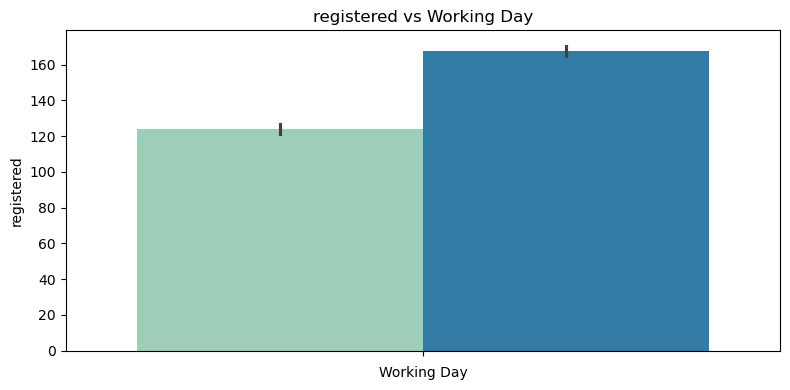

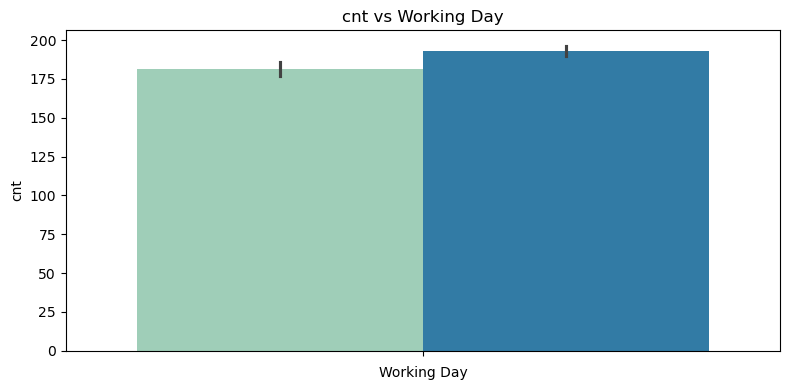

In [15]:
# plotting the features vs workingday
for feature in data[num_features]:
    plt.figure(figsize=(8,4))
    sns.barplot(data=data, hue='workingday',y=feature, palette='YlGnBu', legend=False)
    plt.title(f'{feature} vs Working Day')
    plt.xlabel('Working Day')
    plt.ylabel(feature)
    plt.tight_layout()
    plt.show();

# Feature Engineering

In [16]:
data.isna().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
hr            0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

In [17]:
# the dataset has no missing values

In [18]:
data.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


In [19]:
from sklearn.model_selection import train_test_split

# splitting the data into train val and test sets
x = data.drop('cnt',axis=1)
y = data['cnt']
x_train,x_val,y_train,y_val = train_test_split(x,y,test_size=0.5, random_state=1)

# splitting further to get validation and testing set
x_val,x_test,y_val,y_test = train_test_split(x_val,y_val, test_size=0.5, random_state=1)
print(f'The size of the training set is {x_train.shape}')
print(f'The size of the validation set is {x_val.shape}')
print(f'The size of the testing set is {x_test.shape}')

The size of the training set is (8689, 16)
The size of the validation set is (4345, 16)
The size of the testing set is (4345, 16)


In [20]:
# defining the features for scaling and one-hot encoding
scaling_feat = ['registered','casual','hum','atemp','temp','windspeed']
ohe_feat = ['weekday','season','weathersit','yr','holiday','workingday']

In [21]:
from sklearn.preprocessing import StandardScaler

In [22]:
scaler = StandardScaler() # instantiating the scaler

# scaling the defined features
# training and fitting the scaler on the training data
x_train_scaled = scaler.fit_transform(x_train[scaling_feat])
# converting scaled training data back to a dataframe
x_train_scaled = pd.DataFrame(x_train_scaled, columns=x_train[scaling_feat].columns, index=x_train[scaling_feat].index)
# concacting the scaled values to the training data
x_train = pd.concat([x_train.drop(columns=scaling_feat),x_train_scaled], axis=1).reset_index(drop=True) 

# validation set
# fitting the trained scaler on the validation data
x_val_scaled = scaler.transform(x_val[scaling_feat])
# converting scaled validation data back to a dataframe
x_val_scaled = pd.DataFrame(x_val_scaled, columns=x_val[scaling_feat].columns, index=x_val[scaling_feat].index)
# concacting the scaled values to the validation data
x_val = pd.concat([x_val.drop(columns=scaling_feat),x_val_scaled], axis=1).reset_index(drop=True) 

# test set
# fitting the trained scaler on the testing data
x_test_scaled = scaler.transform(x_test[scaling_feat])
# converting scaled test data back to a dataframe
x_test_scaled = pd.DataFrame(x_test_scaled, columns=x_test[scaling_feat].columns, index=x_test[scaling_feat].index)
# concacting the scaled values to the testing data
x_test = pd.concat([x_test.drop(columns=scaling_feat),x_test_scaled], axis=1).reset_index(drop=True) 

In [23]:
# one hot encoding the categorical variables
# training data
x_train = pd.get_dummies(x_train, columns=ohe_feat, drop_first=True, dtype=int)

# validation data
x_val = pd.get_dummies(x_val, columns=ohe_feat, drop_first=True, dtype=int)

# testing data
x_test = pd.get_dummies(x_test, columns=ohe_feat, drop_first=True, dtype=int)

In [24]:
print(f'The size of the training data is {x_train.shape}')
print(f'The size of the validation data is {x_val.shape}')
print(f'The size of the testing data is {x_test.shape}')

The size of the training data is (8689, 25)
The size of the validation data is (4345, 25)
The size of the testing data is (4345, 25)


In [25]:
x_train.head()

,instant,dteday,mnth,hr,registered,casual,hum,atemp,temp,windspeed,...,weekday_6,season_2,season_3,season_4,weathersit_2,weathersit_3,weathersit_4,yr_1,holiday_1,workingday_1
0,2345,2011-04-12,4,14,-0.829428,-0.395884,0.978077,0.062431,0.023338,0.768012,...,0,1,0,0,1,0,0,0,0,1
1,5195,2011-08-09,8,8,1.360227,0.092599,0.152217,1.302863,1.276368,-1.552817,...,0,0,1,0,0,0,0,0,0,1
2,97,2011-01-05,1,5,-0.998383,-0.721540,-0.828492,-1.442805,-1.438531,-0.209093,...,0,0,0,0,0,0,0,0,0,1
3,16899,2012-12-11,12,21,0.285674,-0.436591,-0.518794,-0.911442,-0.916435,0.034774,...,0,0,0,1,0,0,0,1,0,1
4,3825,2011-06-13,6,6,-0.356354,-0.579066,0.048985,0.240137,0.232176,1.867051,...,0,1,0,0,0,0,0,0,0,1


In [26]:
# dropping the redundant features of date time
x_train = x_train.drop(columns=['dteday','mnth','hr'], axis=1)
x_val = x_val.drop(columns=['dteday','mnth','hr'], axis=1)
x_test = x_test.drop(columns=['dteday','mnth','hr'], axis=1)

In [27]:
# checking the VIF scores
from statsmodels.stats.outliers_influence import variance_inflation_factor
def vif(data):
    vif_series = pd.Series([variance_inflation_factor(data.values,i) for i in range(data.shape[1])],
                       index=data.columns,
                       dtype=float)
    return vif_series

In [28]:
# checking the VIF values for the xtrain dataset
vif(x_train)

C:\Users\Hrishikesh\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


instant         46.648436
registered       1.594633
casual           2.156396
hum              1.636588
atemp           45.158485
temp            47.464081
windspeed        1.222352
weekday_1             inf
weekday_2             inf
weekday_3             inf
weekday_4             inf
weekday_5             inf
weekday_6        1.652068
season_2         2.641126
season_3         5.780187
season_4         6.236985
weathersit_2     1.534155
weathersit_3     1.333230
weathersit_4     1.002573
yr_1            20.827664
holiday_1             inf
workingday_1          inf
dtype: float64

In [29]:
x_train.drop(columns=['instant','temp'],axis=1, inplace=True)
vif(x_train)

C:\Users\Hrishikesh\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


registered      1.587577
casual          2.139831
hum             1.634055
atemp           2.455288
windspeed       1.159524
weekday_1            inf
weekday_2            inf
weekday_3            inf
weekday_4            inf
weekday_5            inf
weekday_6       1.588280
season_2        2.187804
season_3        3.215756
season_4        1.789778
weathersit_2    1.527262
weathersit_3    1.332039
weathersit_4    1.002466
yr_1            1.951797
holiday_1            inf
workingday_1         inf
dtype: float64

In [30]:
# dropping the above columns from the validation and testing dataset as well, as theese columns had high multicollinearity
x_val.drop(columns=['instant','temp'],axis=1, inplace=True)
x_test.drop(columns=['instant','temp'],axis=1, inplace=True)

# Model Building

### Pre-defined functions for model evaluation

In [31]:
# pre-defined function for the RMSE score
def rmse(actual, predicted):
    mse = ((actual - predicted)**2).mean() # calculating the mean squared error
    rmse1 = np.sqrt(mse) # calculating the root mean squared error
    return rmse1

In [32]:
# pre-defined function to compare the model scores
results = pd.DataFrame(columns=['Model','Score'])
def score(model,score):
    global results
    model_results = pd.DataFrame({'Model':[model],'Score':[score]}) # creating a dataframe of the model name and its score
    results = pd.concat([results, model_results], ignore_index=True) # adding the name and score of each model to the resutls dataframe
    return results

# Logistic Regression

In [33]:
from sklearn.linear_model import LogisticRegression

In [34]:
lg_model = LogisticRegression() # instantiating the model
lg_model.fit(x_train,y_train) # fitting on the training data

LogisticRegression()

In [35]:
pred_train_lg = lg_model.predict(x_train) # predicting on the training data
pred_val_lg = lg_model.predict(x_val) # predicting on the validation data

In [36]:
print(f'The rmse score for the LR model on training data is {rmse(y_train, pred_train_lg)}') # score of the model on the training data
print(f'The rmse score for the LR model on validation data is {rmse(y_val, pred_val_lg)}') # score of the model on the validation data

The rmse score for the LR model on training data is 54.40833473991108
The rmse score for the LR model on validation data is 59.12629691889872


In [37]:
score('Logistic Regression',rmse(y_val, pred_val_lg))

C:\Users\Hrishikesh\AppData\Local\Temp\ipykernel_17516\1430965439.py:6: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results = pd.concat([results, model_results], ignore_index=True) # adding the name and score of each model to the resutls dataframe


,Model,Score
0,Logistic Regression,59.126297


# Support Vector Machine Regressor

In [38]:
from sklearn import svm
import warnings
warnings.filterwarnings('ignore')

In [39]:
svm_model = svm.SVR() #instantiating the SVM model
svm_model.fit(x_train,y_train) # training on the x_train data

SVR()

In [40]:
pred_train_svm = svm_model.predict(x_train) # predicting the model on the training data
pred_val_svm = svm_model.predict(x_val) # predicting the model on the validation data

In [41]:
print(f'The rmse score for the SVM model on training data is {rmse(y_train, pred_train_svm)}') # score of the model on the training data
print(f'The rmse score for the SVM model on validation data is {rmse(y_val, pred_val_svm)}') # score of the model on the validation data

The rmse score for the SVM model on training data is 65.41705159440139
The rmse score for the SVM model on validation data is 71.36970182024874


In [42]:
score('Support Vector Machine',rmse(y_val, pred_val_svm))

,Model,Score
0,Logistic Regression,59.126297
1,Support Vector Machine,71.369702


# KNN Regressor

In [43]:
from sklearn.neighbors import KNeighborsRegressor

In [44]:
knn = KNeighborsRegressor(n_neighbors=5)
knn.fit(x_train,y_train)

KNeighborsRegressor()

In [45]:
pred_train_knn = knn.predict(x_train) # predicting the model on the training data
pred_val_knn = knn.predict(x_val) # predicting the model on the validation data

In [46]:
print(f'The rmse score for the KNN model on training data is {rmse(y_train, pred_train_knn)}') # score of the model on the training data
print(f'The rmse score for the KNN model on validation data is {rmse(y_val, pred_val_knn)}') # score of the model on the validation data

The rmse score for the KNN model on training data is 29.607443160939347
The rmse score for the KNN model on validation data is 35.59918283025353


In [47]:
score('KNN Regressor',rmse(y_val, pred_val_knn))

,Model,Score
0,Logistic Regression,59.126297
1,Support Vector Machine,71.369702
2,KNN Regressor,35.599183


# Decision Tree

In [48]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import RandomizedSearchCV

In [49]:
dtree = DecisionTreeRegressor()
param_dist = {'max_depth':np.arange(1,8,1),
              'min_samples_split':np.arange(1,8,1),
              'min_samples_leaf':np.arange(1,7,1),
              'max_leaf_nodes':np.arange(1,11,1),
              'min_impurity_decrease':[0.001,0.01,0.1]}
scorer = 'neg_root_mean_squared_error'
dtree_search = RandomizedSearchCV(dtree, param_distributions=param_dist, cv=5, scoring=scorer, n_iter=60, random_state=1)
dtree_search.fit(x_train,y_train)
best_model_dtree = dtree_search.best_estimator_
best_model_dtree.fit(x_train,y_train)

DecisionTreeRegressor(max_depth=5, max_leaf_nodes=10, min_impurity_decrease=0.1,
                      min_samples_leaf=4, min_samples_split=7)

In [50]:
pred_train_dtree = best_model_dtree.predict(x_train) # predicting the model on the training data
pred_val_dtree = best_model_dtree.predict(x_val) # predicting the model on the validation data

In [51]:
print(f'The rmse score for the Dtree model on training data is {rmse(y_train, pred_train_dtree)}') # score of the model on the training data
print(f'The rmse score for the Dtree model on validation data is {rmse(y_val, pred_val_dtree)}') # score of the model on the validation data

The rmse score for the Dtree model on training data is 36.42263711431447
The rmse score for the Dtree model on validation data is 38.55501689632937


In [52]:
score('Decision Tree',rmse(y_val, pred_val_dtree)) # adding the validation score to the dataframe

,Model,Score
0,Logistic Regression,59.126297
1,Support Vector Machine,71.369702
2,KNN Regressor,35.599183
3,Decision Tree,38.555017


# Random Forest

In [53]:
from sklearn.ensemble import RandomForestRegressor

In [54]:
rf_model = RandomForestRegressor()
param_dist = {'n_estimators':np.arange(50,450,50),
                       'max_depth':np.arange(0,9,1),
                       'min_samples_leaf':[1,2,4,6,8],
                       'min_samples_split':[2,5,10],
                       'max_features':['auto','sqrt','log2']}
scorer = 'neg_root_mean_squared_error'
random_search_rf = RandomizedSearchCV(rf_model, param_distributions=param_dist, cv=5, n_iter=60, scoring=scorer, random_state=1)
random_search_rf.fit(x_train,y_train)
best_model_rf = random_search_rf.best_estimator_
best_model_rf.fit(x_train,y_train)

RandomForestRegressor(max_depth=8, max_features='log2', min_samples_leaf=2,
                      min_samples_split=5, n_estimators=350)

In [55]:
pred_train_rf = best_model_rf.predict(x_train) # predicting the model on the training data
pred_val_rf = best_model_rf.predict(x_val) # predicting the model on the validation data

In [56]:
print(f'The rmse score for the RF model on training data is {rmse(y_train, pred_train_rf)}') # score of the model on the training data
print(f'The rmse score for the RF model on validation data is {rmse(y_val, pred_val_rf)}') # score of the model on the validation data

The rmse score for the RF model on training data is 35.4894815641696
The rmse score for the RF model on validation data is 40.24288108414463


In [57]:
score('Random Forest',rmse(y_val, pred_val_rf)) # adding the validation score to the dataframe

,Model,Score
0,Logistic Regression,59.126297
1,Support Vector Machine,71.369702
2,KNN Regressor,35.599183
3,Decision Tree,38.555017
4,Random Forest,40.242881


# XGBoost Regressor

In [58]:
from xgboost import XGBRegressor

In [59]:
xgb = XGBRegressor()
param_dist = {'n_estimators':np.arange(50,450,50),
              'learning_rate':np.linspace(0.01, 0.3, 10),
              'max_depth':np.arange(1,8,1),
              'min_child_weight':np.arange(1,8,1),
              'gamma':np.linspace(0,0.5,6),
              'colsample_bytree':np.linspace(0.3,1,8),
              'reg_alpha':[0,0.1,1],
              'reg_lambda':[0.1,1,10]}
scorer = 'neg_root_mean_squared_error'
random_search_xgb = RandomizedSearchCV(xgb, param_distributions=param_dist, cv=5, n_iter=60, random_state=1, scoring=scorer)
random_search_xgb.fit(x_train,y_train)
best_model_xgb = random_search_xgb.best_estimator_
best_model_xgb.fit(x_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.7999999999999999, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, feature_weights=None,
             gamma=0.4, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.23555555555555557,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=2, max_leaves=None,
             min_child_weight=7, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=400, n_jobs=None,
             num_parallel_tree=None, ...)

In [60]:
pred_train_xgb = best_model_xgb.predict(x_train) # predicting the model on the training data
pred_val_xgb = best_model_xgb.predict(x_val) # predicting the model on the validation data

In [61]:
print(f'The rmse score for the XGB model on training data is {rmse(y_train, pred_train_xgb)}') # score of the model on the training data
print(f'The rmse score for the XGB model on validation data is {rmse(y_val, pred_val_xgb)}') # score of the model on the validation data

The rmse score for the XGB model on training data is 3.8223079373975963
The rmse score for the XGB model on validation data is 4.886285448874908


In [62]:
score('XGBoost',rmse(y_val, pred_val_xgb)) # adding the validation score to the dataframe

,Model,Score
0,Logistic Regression,59.126297
1,Support Vector Machine,71.369702
2,KNN Regressor,35.599183
3,Decision Tree,38.555017
4,Random Forest,40.242881
5,XGBoost,4.886285


# LightGBM Regressor

In [63]:
from lightgbm import LGBMRegressor

In [64]:
lgbm = LGBMRegressor()
param_dist = {'n_estimators':np.arange(50,450,50),
              'learning_rate':[0.001,0.01,0.005,0.1],
              'max_depth':np.arange(1,7,1),
              'num_leaves':np.arange(1,10,1),
              'min_child_samples':np.arange(1,10,1),
              'subsample':np.arange(0.3,1,0.1),
              'colsample_bytree':np.arange(0.3,1,0.1),
              'reg_alpha':[0,0.1,0.5],
              'reg_lambda':[0,0.1,0.5]}
scorer = 'neg_root_mean_squared_error'
random_search_lgbm = RandomizedSearchCV(lgbm, param_distributions=param_dist, cv=5, n_iter=60, random_state=1, scoring=scorer)
random_search_lgbm.fit(x_train,y_train)
best_model_lgbm = random_search_lgbm.best_estimator_
best_model_lgbm.fit(x_train,y_train)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 699
[LightGBM] [Info] Number of data points in the train set: 6951, number of used features: 19
[LightGBM] [Info] Start training from score 185.253776
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 701
[LightGBM] [Info] Number of data points in the train set: 6951, number of used features: 19
[LightGBM] [Info] Start training from score 187.657891
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 693
[LightGBM] [Info] Number of data points in the train set:

LGBMRegressor(colsample_bytree=0.9000000000000001, max_depth=4,
              min_child_samples=6, n_estimators=350, num_leaves=6,
              reg_alpha=0.1, reg_lambda=0, subsample=0.5)

In [65]:
pred_train_lgbm = best_model_lgbm.predict(x_train) # predicting the model on the training data
pred_val_lgbm = best_model_lgbm.predict(x_val) # predicting the model on the validation data

In [66]:
print(f'The rmse score for the LGBM model on training data is {rmse(y_train, pred_train_lgbm)}') # score of the model on the training data
print(f'The rmse score for the LGBM model on validation data is {rmse(y_val, pred_val_lgbm)}') # score of the model on the validation data

The rmse score for the LGBM model on training data is 3.0471624540032765
The rmse score for the LGBM model on validation data is 4.0560298931566106


In [67]:
score('LightGBM',rmse(y_val, pred_val_lgbm)) # adding the validation score to the dataframe

,Model,Score
0,Logistic Regression,59.126297
1,Support Vector Machine,71.369702
2,KNN Regressor,35.599183
3,Decision Tree,38.555017
4,Random Forest,40.242881
5,XGBoost,4.886285
6,LightGBM,4.056030


### We can see that the LightGBM model has the best performance on the validation data

# Predicting using the best model on the Testing Data

In [69]:
pred_test = best_model_lgbm.predict(x_test)

In [70]:
print(f'The rmse score for the LGBM model on test data is {rmse(y_test, pred_test)}') # score of the model on the test data

The rmse score for the LGBM model on test data is 4.490893428957382


# Feature Importances

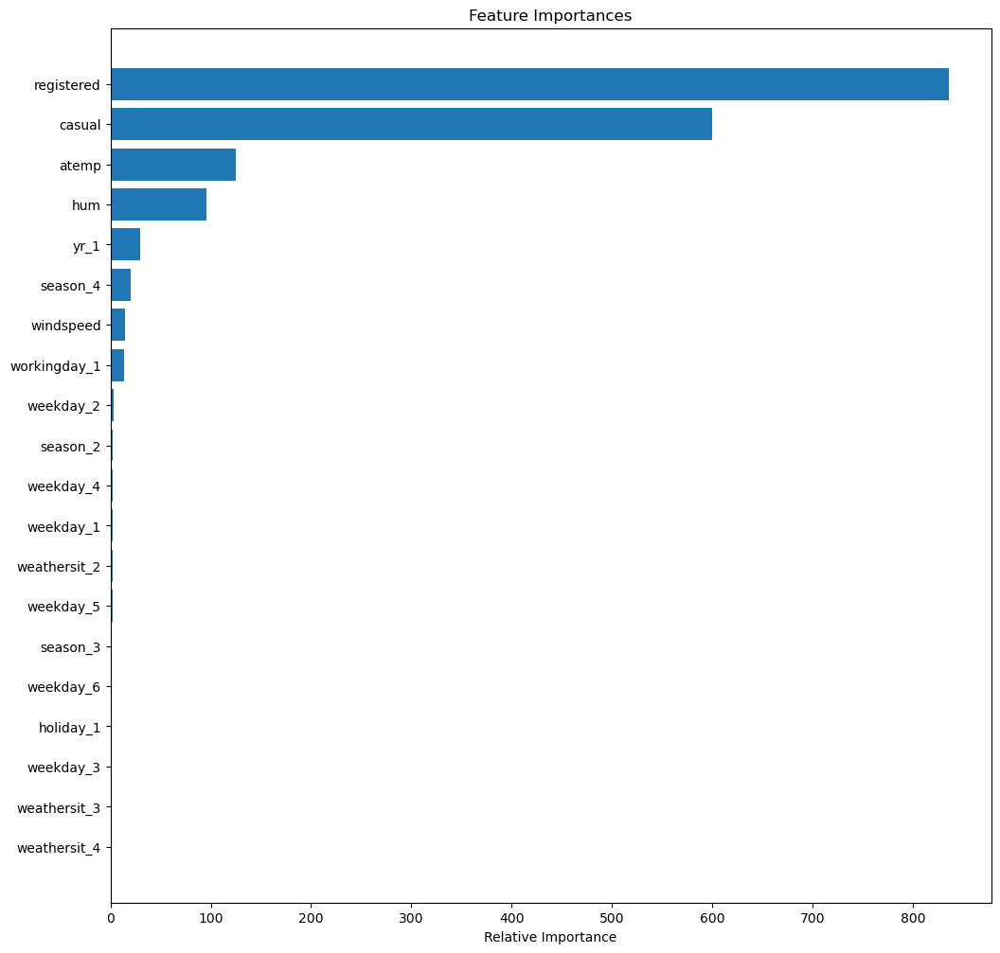

In [72]:
feature_names = x_train.columns
importances = best_model_lgbm.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.savefig('feature_importances.png',bbox_inches='tight')
plt.show()